In [1]:
from Dataset.generate_datasets import make_gravitational_waves
from pathlib import Path
from gtda.time_series import SlidingWindow, TakensEmbedding

import numpy as np

# [Library] PyTorch
import torch
import torch.nn as nn
import torch.optim as optim

# [Library] Scikit-learn
from sklearn.model_selection import train_test_split

from gtda.diagrams import PersistenceEntropy, Scaler
from gtda.homology import VietorisRipsPersistence
from gtda.metaestimators import CollectionTransformer
from gtda.pipeline import Pipeline
from gtda.time_series import TakensEmbedding
from sklearn.decomposition import PCA

# Silence the warninigs, don't let the voices ring in my head
import warnings
warnings.filterwarnings("ignore")

In [2]:
def getPipe():
    embedding_dimension = 100
    embedding_time_delay = 10
    stride = 10

    embedder = TakensEmbedding(time_delay=embedding_time_delay,
                            dimension=embedding_dimension,
                            stride=stride)

    batch_pca = CollectionTransformer(PCA(n_components=3))

    persistence = VietorisRipsPersistence(homology_dimensions=[1], n_jobs=-1)

    scaling = Scaler()

    entropy = PersistenceEntropy(normalize=True, nan_fill_value=-10)


    steps = [("embedder", embedder),
            ("pca", batch_pca),
            ("persistence", persistence),
            ("scaling", scaling)]

    return Pipeline(steps)

pipe = getPipe()

def getPipe2(pipe, signal, fixed = 200):
    betti = pipe.fit_transform(signal)
    # Eliminamos el tercer eje porque solo es el tipo de homología y solo queremos la primera dimensión, asi que es redundante
    betti = betti[:, :, 0:2].transpose(0, 2, 1)
    # Ordenamos los datos para que sean consistentes
    def sort_persistence(x):
        def time_life_diagram(x):
            return x[1] - x[0]
        return np.array([sorted(betti[i], key=time_life_diagram) for i in range(len(betti))])
    ordered = sort_persistence(betti)
    ordered = ordered[:, :, 0:fixed]
    return ordered

In [3]:
Rmin = 0.075
Rmax = 0.65
n_signals = 10
DATA = Path("./Dataset")

noisy_signals, gw_signals, labels = make_gravitational_waves(
    path_to_data=DATA, n_signals=n_signals, r_min=Rmin, r_max=Rmax, n_snr_values=100
)
# Lo volvemos un numpy array
noisy_signals, gw_signals, labels = np.array(noisy_signals), np.array(gw_signals), np.array(labels)
# Standardize the data
noisy_mean,  noisy_std = noisy_signals.mean(), noisy_signals.std()
noisy_signals = (noisy_signals - noisy_mean) / noisy_std
gw_signals = (gw_signals - noisy_mean) / noisy_std
# Standarize the signa

print (noisy_signals.shape, gw_signals.shape, labels.shape)


(10, 8692) (10, 8192) (10,)


In [4]:
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# get the index corresponding to the first pure noise time series
background_idx = np.argmin(labels)
# get the index corresponding to the first noise + gravitational wave time series
signal_idx = np.random.randint(1, len(labels))

ts_noise = noisy_signals[signal_idx]
ts_background = noisy_signals[signal_idx]
ts_signal = gw_signals[signal_idx]

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(x=list(range(len(ts_noise))), y=ts_noise, mode="lines", name="noise"),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        x=list(range(len(ts_background))),
        y=ts_background,
        mode="lines",
        name="background",
    ),
    row=1,
    col=2,
)

fig.add_trace(
    go.Scatter(x=list(range(len(ts_signal))), y=ts_signal, mode="lines", name="signal"),
    row=1,
    col=2,
)
fig.show()

In [5]:
# Volver lo anterior una función que reciba una señal y la version limpia
def plot_waves(noisy_signal, gw_signal, labels):

    # get the index corresponding to the first pure noise time series
    fig = make_subplots(rows=1, cols=2)

    fig.add_trace(
        go.Scatter(x=list(range(len(noisy_signal))), y=noisy_signal, mode="lines", name="noise"),
        row=1,
        col=1,
    )
    # Background signal
    fig.add_trace(
        go.Scatter(
            x=list(range(len(noisy_signal))),
            y=noisy_signal,
            mode="lines",
            name="background",
        ),
        row=1,
        col=2,
    )
    # Gravitational wave signal
    fig.add_trace(
        go.Scatter(x=list(range(len(gw_signal))), y=gw_signal, mode="lines", name="signal"),
        row=1,
        col=2,
    )
    
    fig.show()

plot_waves(noisy_signals[signal_idx], gw_signals[signal_idx], labels[signal_idx])

In [6]:
# Split the clean signals
X_train = np.load("final_noisy.npy")
X_train_betti = np.load("final_betti.npy")
Y_train = np.load("final_signals.npy")
X_test = np.load("final_test_noisy.npy")
X_test_betti = np.load("final_test_betti.npy")
Y_test = np.load("final_test_signals.npy")


In [7]:
# Clase que lee los betti
class BettEncoder(nn.Module):
    
    # Constructor
    def __init__(self,
            in_channels : int  = 2,
            hidden_channels : int = 16,
            output_dim : int = 128,
    ):
        # Constructor padre
        super(BettEncoder, self).__init__()

        # Capa de entrada
        self.conv1 = nn.Conv1d(in_channels=in_channels, out_channels=hidden_channels, kernel_size=3, stride=1, padding=1) # [2, 200] -> [16, 200]
        self.maxpool1 = nn.MaxPool1d(kernel_size=2, stride=2, padding=0) # [16, 200] -> [16, 100]
        self.conv2 = nn.Conv1d(in_channels=hidden_channels, out_channels=2*hidden_channels, kernel_size=3, stride=1, padding=1) # [16, 100] -> [16, 100]
        self.maxpool2 = nn.MaxPool1d(kernel_size=2, stride=2, padding=0) # [16, 100] -> [16, 50]
        self.conv3 = nn.Conv1d(in_channels=2*hidden_channels, out_channels=4*hidden_channels, kernel_size=3, stride=1, padding=1)
        self.maxpool3 = nn.MaxPool1d(kernel_size=2, stride=2, padding=0) # [16, 50] -> [16, 25]

        # Capa de salida
        self.fc1 = nn.Linear(4*hidden_channels * 25, output_dim)
        self.fc2 = nn.Linear(output_dim, output_dim)
        
    # Forward
    def forward(self, x):
        # Primera capa
        x = torch.relu(self.conv1(x))
        x = self.maxpool1(x)
        x = torch.relu(self.conv2(x))
        x = self.maxpool2(x)
        x = torch.relu(self.conv3(x))
        x = self.maxpool3(x)
        # Flatten
        x = x.view(x.size(0), -1)
        # Capa de salida
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.fc2(x)
        x = torch.relu(x)
        return x


In [8]:
class CleanerTopo(nn.Module):
    def __init__(self,
        input_dim=8192,
        latent_dim=128,
        hidden_channels=32,
        dropout=0.5,
        n_layers=3
        ):
        super(CleanerTopo, self).__init__()

        # Parameters
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.dropout = dropout
        self.hidden_channels = hidden_channels
        self.n_layers = n_layers

        # Also add dropout
        encoder = []
        encoder.append(nn.Conv1d(1, hidden_channels, 7, padding=3)) # 8192 -> 8192
        encoder.append(nn.Dropout(dropout))
        encoder.append(nn.BatchNorm1d(hidden_channels))
        encoder.append(nn.ReLU()) # 8192
        encoder.append(nn.MaxPool1d(4)) # 2048
        encoder.append(nn.Conv1d(hidden_channels, 2*hidden_channels, 7, padding=3)) # 2048 -> 2048
        encoder.append(nn.Dropout(dropout))
        encoder.append(nn.BatchNorm1d(2*hidden_channels))
        encoder.append(nn.ReLU()) # 2048
        encoder.append(nn.MaxPool1d(4)) # 512
        encoder.append(nn.Conv1d(2*hidden_channels, 4*hidden_channels, 7, padding=3)) # 512 -> 512
        encoder.append(nn.Dropout(dropout))
        encoder.append(nn.BatchNorm1d(4*hidden_channels))
        encoder.append(nn.ReLU()) # 512
        encoder.append(nn.MaxPool1d(4)) # 128
        self.encoder = nn.Sequential(*encoder)
        self.output_dim = self.get_output_dim(input_dim)
        

        # Encoder de betti
        self.bett_encoder = BettEncoder(in_channels=2, hidden_channels=hidden_channels, output_dim=latent_dim)

        print (self.output_dim)
        # Linear de prosamiento
        linears = []
        linears.append(nn.Linear(self.output_dim + self.latent_dim, self.latent_dim))
        for i in range(n_layers):
            linears.append(nn.Linear(self.latent_dim, self.latent_dim))
            linears.append(nn.LayerNorm(self.latent_dim))
            linears.append(nn.Dropout(dropout))
            linears.append(nn.ReLU())
        linears.append(nn.Linear(self.latent_dim, self.output_dim))
        self.linears = nn.Sequential(*linears)


        # Decoder
        decoder = []
        decoder.append(nn.ConvTranspose1d(4*hidden_channels, 2*hidden_channels, 7, stride=4, padding=0)) # 128 -> 512
        decoder.append(nn.Dropout(dropout))
        decoder.append(nn.BatchNorm1d(2*hidden_channels))
        decoder.append(nn.ReLU()) # 512
        decoder.append(nn.ConvTranspose1d(2*hidden_channels, hidden_channels, 7, stride=4, padding=1)) # 512 -> 1024
        decoder.append(nn.Dropout(dropout))
        decoder.append(nn.BatchNorm1d(hidden_channels))
        decoder.append(nn.ReLU()) # 1024
        decoder.append(nn.ConvTranspose1d(hidden_channels, 1, 6, stride=4, padding=1)) # 1024 -> 2048
        self.decoder = nn.Sequential(*decoder)

        # Activation function
        self.silu = nn.ReLU()

    # Feed the input through the encoder
    def forward(self, x, bet):
        
        enc = self.encoder(x.unsqueeze(1))
        bs, ch, seq = enc.size()
        enc = enc.view(-1, self.output_dim)
        bet_feat = self.bett_encoder(bet)
        x = self.linears(torch.cat((enc, bet_feat), 1))
        x = torch.relu(enc + x)
        enc = x.view(bs, ch, seq)
        dec = self.decoder(enc)
        dec.squeeze_(1)
        return dec
    
    def get_output_dim(self, input_dim):
        x = torch.randn(1, 1, input_dim)
        x = self.encoder(x)
        return x.view(1, -1).shape[1]


In [9]:
class Cleaner(nn.Module):
    def __init__(self,
        input_dim=8192,
        latent_dim=128,
        hidden_channels=32,
        dropout=0.5,
        n_layers=3
        ):
        super(Cleaner, self).__init__()

        # Parameters
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.dropout = dropout
        self.hidden_channels = hidden_channels
        self.n_layers = n_layers

        # Also add dropout
        encoder = []
        encoder.append(nn.Conv1d(1, hidden_channels, 7, padding=3)) # 8192 -> 8192
        encoder.append(nn.Dropout(dropout))
        encoder.append(nn.BatchNorm1d(hidden_channels))
        encoder.append(nn.ReLU()) # 8192
        encoder.append(nn.MaxPool1d(4)) # 2048
        encoder.append(nn.Conv1d(hidden_channels, 2*hidden_channels, 7, padding=3)) # 2048 -> 2048
        encoder.append(nn.Dropout(dropout))
        encoder.append(nn.BatchNorm1d(2*hidden_channels))
        encoder.append(nn.ReLU()) # 2048
        encoder.append(nn.MaxPool1d(4)) # 512
        encoder.append(nn.Conv1d(2*hidden_channels, 4*hidden_channels, 7, padding=3)) # 512 -> 512
        encoder.append(nn.Dropout(dropout))
        encoder.append(nn.BatchNorm1d(4*hidden_channels))
        encoder.append(nn.ReLU()) # 512
        encoder.append(nn.MaxPool1d(4)) # 128
        self.encoder = nn.Sequential(*encoder)
        self.output_dim = self.get_output_dim(input_dim)

        print (self.output_dim)

        # Set a proyection
        self.proyection = nn.Linear(self.output_dim, self.latent_dim)
        # Linear de prosamiento
        linears = []
        for i in range(n_layers):
            linears.append(nn.Linear(self.latent_dim, self.latent_dim))
            linears.append(nn.LayerNorm(self.latent_dim))
            linears.append(nn.Dropout(dropout))
            linears.append(nn.ReLU())
        linears.append(nn.Linear(self.latent_dim, self.output_dim))
        self.linears = nn.Sequential(*linears)


        # Decoder
        decoder = []
        decoder.append(nn.ConvTranspose1d(4*hidden_channels, 2*hidden_channels, 7, stride=4, padding=0)) # 128 -> 512
        decoder.append(nn.Dropout(dropout))
        decoder.append(nn.BatchNorm1d(2*hidden_channels))
        decoder.append(nn.ReLU()) # 512
        decoder.append(nn.ConvTranspose1d(2*hidden_channels, hidden_channels, 7, stride=4, padding=1)) # 512 -> 1024
        decoder.append(nn.Dropout(dropout))
        decoder.append(nn.BatchNorm1d(hidden_channels))
        decoder.append(nn.ReLU()) # 1024
        decoder.append(nn.ConvTranspose1d(hidden_channels, 1, 6, stride=4, padding=1)) # 1024 -> 2048
        self.decoder = nn.Sequential(*decoder)

        # Activation function
        self.silu = nn.ReLU()

    # Feed the input through the encoder
    def forward(self, x):
        
        enc = self.encoder(x.unsqueeze(1))
        bs, ch, seq = enc.size()
        enc = enc.view(-1, self.output_dim)
        proy = torch.relu(self.proyection(enc))
        x = self.linears(proy)
        x = torch.relu(enc + x)
        enc = x.view(bs, ch, seq)
        dec = self.decoder(enc)
        dec.squeeze_(1)
        return dec
    
    def get_output_dim(self, input_dim):
        x = torch.randn(1, 1, input_dim)
        x = self.encoder(x)
        return x.view(1, -1).shape[1]


In [10]:
# Create the model with Topological features
modelTopo = CleanerTopo(
    input_dim=noisy_signals.shape[1],
    hidden_channels=32,
    latent_dim=128,
    dropout=0.6,
)

# Create the model
model = Cleaner(
    input_dim=noisy_signals.shape[1],
    hidden_channels=32,
    latent_dim=128,
    dropout=0.6,
)

17280
17280


In [11]:
# Noiser
class Noiser:

    # Asignamos las señales limpias y las ajustamos al tamaño de la señal con ruido
    def __init__(self, 
            signals,
            fixed_length : int = 8192,
            noise_level : int =0.1,
            decoy_rate : int =0.5,
            normal_values : list = [0, 1]
            ):
        self.signals = signals
        self.fixed_length = fixed_length
        self.noise_level = noise_level
        self.decoy_rate = decoy_rate
        self.normal_values = normal_values
        # Ajustamos las señales

    # Que nos devuelva BATCH_SIZE señales con ruido agregado
    def __call__(self, batch_size):
        # Creamos un donde habra o no señal
        decoy = np.random.choice([0, 1], size=batch_size, p=[1 - self.decoy_rate, self.decoy_rate])
        # Seleccionamos las señales
        signal_idx = np.random.choice(len(self.signals), size=batch_size)
        signals = self.signals[signal_idx]
        # Add the padding
        signals = np.pad(signals, ((0, 0), (0, self.fixed_length - signals.shape[1])))
        # Generamos ruido
        noise = np.random.normal(0, self.noise_level, (batch_size, self.fixed_length))
        # Agregamos ruido
        noise_signal = signals * decoy[:, None] + noise 
        return (signals * decoy[:, None], noise_signal, decoy)

In [12]:
noiser = Noiser(
    Y_train,
    fixed_length=noisy_signals.shape[1],
    noise_level=0.8,
    decoy_rate=0.40,
)
# Visualizamos las señales
signals, noisy, decoy = noiser(10)
print (signals.shape, noisy.shape, decoy.shape)
# Solo visualizamos la primera señal
plot_waves(noisy[0], signals[0], decoy[0])

(10, 8692) (10, 8692) (10,)


In [13]:
# Model optimizer
# Train the model
EPOCHS = 20
BATCH_SIZE = 64
LEARNING_RATE = 1e-3

optimizerTopo = optim.Adam(modelTopo.parameters(), lr=LEARNING_RATE)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterionTopo = nn.HuberLoss()
criterion = nn.HuberLoss()
# Train the model
historyTopo = []
history = []

In [14]:
for epoch in range(EPOCHS):
    for i in range(0, len(X_train), BATCH_SIZE):
        # Get the batch
        signals, noisy = Y_train[i:i + BATCH_SIZE], X_train[i:i + BATCH_SIZE]
        betti = X_train_betti[i:i + BATCH_SIZE]
        betti = torch.tensor(betti, dtype=torch.float32)
        signals = torch.tensor(signals, dtype=torch.float32)
        noisy = torch.tensor(noisy, dtype=torch.float32)
        # Forward pass
        outputsTopo = modelTopo(noisy, betti)
        outputs = model(noisy)
        lossTopo = criterionTopo(outputsTopo, signals).mean()
        loss = criterion(outputs, signals).mean()
        # Backward pass
        optimizerTopo.zero_grad()
        optimizer.zero_grad()
        lossTopo.backward()
        loss.backward()
        historyTopo.append(lossTopo.item())
        history.append(loss.item())
        optimizerTopo.step()
        optimizer.step()
        if (i / BATCH_SIZE) % 10 == 0:
            print (f"Epoch {epoch}, LossTopo {np.mean(historyTopo[-50:])}")
            print (f"Epoch {epoch}, Loss {np.mean(history[-50:])}")

    # Save the model 
    # Save the model
    torch.save(modelTopo.state_dict(), "Topo.pth")
    torch.save(model.state_dict(), "Model.pth")

Epoch 0, LossTopo 0.5375993251800537
Epoch 0, Loss 0.47428297996520996
Epoch 0, LossTopo 0.32907112078233197
Epoch 0, Loss 0.2510010586543517
Epoch 0, LossTopo 0.24311868704500653
Epoch 0, Loss 0.1757408334385781
Epoch 0, LossTopo 0.19524275583605613
Epoch 0, Loss 0.13503984554160026
Epoch 0, LossTopo 0.16367057483734154
Epoch 0, Loss 0.11053004183965486
Epoch 0, LossTopo 0.13322874009609223
Epoch 0, Loss 0.08666204165667296
Epoch 0, LossTopo 0.07917979657649994
Epoch 0, Loss 0.04541578933596611
Epoch 0, LossTopo 0.05572841193526983
Epoch 0, Loss 0.030544693954288958
Epoch 0, LossTopo 0.04208383213728666
Epoch 0, Loss 0.023730273358523846
Epoch 0, LossTopo 0.033515839502215386
Epoch 0, Loss 0.019348091054707764
Epoch 0, LossTopo 0.027838686481118202
Epoch 0, Loss 0.01589222738519311
Epoch 0, LossTopo 0.023725699931383133
Epoch 0, Loss 0.012921444559469818
Epoch 0, LossTopo 0.020489979330450298
Epoch 0, Loss 0.010423487238585948
Epoch 1, LossTopo 0.019139450546354055
Epoch 1, Loss 0.009

KeyboardInterrupt: 

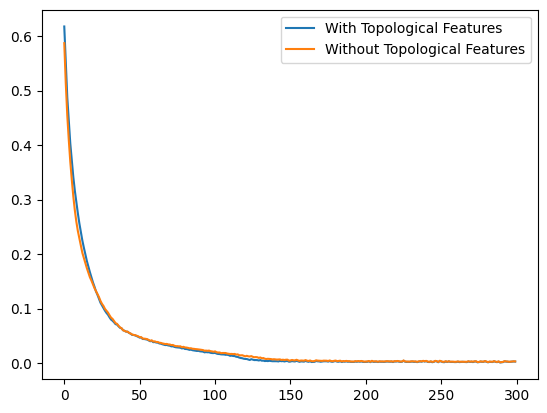

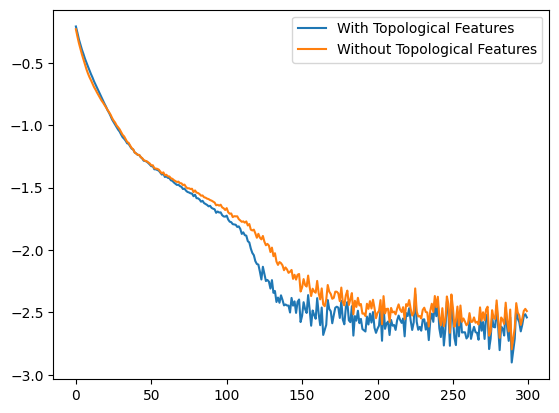

In [15]:
# plot the loss
import matplotlib.pyplot as plt
plt.plot(historyTopo, label="With Topological Features")
plt.plot(history, label="Without Topological Features")
plt.legend()
plt.show()
# Plot the negative log of the loss
plt.plot(np.log10(historyTopo), label="With Topological Features")
plt.plot(np.log10(history), label="Without Topological Features")
plt.legend()
plt.show()

In [ ]:
# Cargamos el modelo previamente guardado
modelTopo.load_state_dict(torch.load("model2.pth"))

RuntimeError: Error(s) in loading state_dict for CleanerTopo:
	Missing key(s) in state_dict: "encoder.2.weight", "encoder.2.bias", "encoder.2.running_mean", "encoder.2.running_var", "encoder.5.weight", "encoder.5.bias", "encoder.7.weight", "encoder.7.bias", "encoder.7.running_mean", "encoder.7.running_var", "encoder.10.weight", "encoder.10.bias", "encoder.12.weight", "encoder.12.bias", "encoder.12.running_mean", "encoder.12.running_var", "bett_encoder.fc1.weight", "bett_encoder.fc1.bias", "bett_encoder.fc2.weight", "bett_encoder.fc2.bias", "decoder.2.running_mean", "decoder.2.running_var", "decoder.6.weight", "decoder.6.bias", "decoder.6.running_mean", "decoder.6.running_var", "decoder.8.weight", "decoder.8.bias". 
	Unexpected key(s) in state_dict: "encoder.3.weight", "encoder.3.bias", "encoder.6.weight", "encoder.6.bias", "bett_encoder.fc.weight", "bett_encoder.fc.bias". 
	size mismatch for decoder.2.weight: copying a param with shape torch.Size([64, 32, 7]) from checkpoint, the shape in current model is torch.Size([64]).
	size mismatch for decoder.2.bias: copying a param with shape torch.Size([32]) from checkpoint, the shape in current model is torch.Size([64]).
	size mismatch for decoder.4.weight: copying a param with shape torch.Size([32, 1, 6]) from checkpoint, the shape in current model is torch.Size([64, 32, 7]).
	size mismatch for decoder.4.bias: copying a param with shape torch.Size([1]) from checkpoint, the shape in current model is torch.Size([32]).

In [ ]:
# Save the model
torch.save(modelTopo.state_dict(), "modelk.pth")

In [15]:
# Test the model
modelTopo.eval()
randomindex = np.random.randint(0, len(X_test))
signals, noisy = Y_test[randomindex:randomindex + 1], X_test[randomindex:randomindex + 1]
tnoisy = torch.tensor(noisy, dtype=torch.float32)
betti = X_test_betti[randomindex:randomindex + 1]
betti = torch.tensor(betti, dtype=torch.float32)
outputs = modelTopo(tnoisy, betti)
# Ahora solo en la izquierda plotea la se;al con ruido y la señal original, y en la derecha la señal generada
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    go.Scatter(x=list(range(len(noisy[0]))), y=noisy[0], mode="lines", name="noise"),
    row=1,
    col=1,
)
fig.add_trace(
    go.Scatter(x=list(range(len(signals[0]))), y=signals[0], mode="lines", name="signal"),
    row=1,
    col=1,
)
fig.add_trace(
    go.Scatter(x=list(range(len(outputs[0]))), y=outputs[0].detach().numpy(), mode="lines", name="output"),
    row=1,
    col=2,
)
fig.show()

In [17]:
# Ahora testeamos el modelo con datos de señales con ruido no generadas por el modelo
Noiser2 = Noiser(
    Y_test,
    fixed_length=noisy_signals.shape[1],
    noise_level=2.3,
    decoy_rate=0.9,
    normal_values=[0, 1]
)


In [27]:
signals, noisy, decoy = Noiser2(BATCH_SIZE//2)
tnoisy = torch.tensor(noisy, dtype=torch.float32)
betti = getPipe2(pipe, noisy)
betti = torch.tensor(betti, dtype=torch.float32)

outputs = modelTopo(tnoisy, betti)
# Ahora solo en la izquierda plotea la se;al con ruido y la señal original, y en la derecha la señal generada
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    go.Scatter(x=list(range(len(noisy[0]))), y=noisy[0], mode="lines", name="noise"),
    row=1,
    col=1,
)
fig.add_trace(
    go.Scatter(x=list(range(len(signals[0]))), y=signals[0], mode="lines", name="signal"),
    row=1,
    col=1,
)
# Poner el ylim como -1, 1 para que se vea mejor
fig.add_trace(
    go.Scatter(x=list(range(len(outputs[0]))), y=outputs[0].detach().numpy(), mode="lines", name="output"),
    row=1,
    col=2,
)
fig.update_yaxes(range=[-6, 6])
fig.show()

In [18]:
randomindex = np.random.randint(0, len(X_test))
signals, noisy = Y_test[randomindex:randomindex + 1], X_test[randomindex:randomindex + 1]
tnoisy = torch.tensor(noisy, dtype=torch.float32)
betti = X_test_betti[randomindex:randomindex + 1]
betti = torch.tensor(betti, dtype=torch.float32)

outputs = modelTopo(tnoisy, betti)
# Ahora solo en la izquierda plotea la se;al con ruido y la señal original, y en la derecha la señal generada
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    go.Scatter(x=list(range(len(noisy[0]))), y=noisy[0], mode="lines", name="noise"),
    row=1,
    col=1,
)
fig.add_trace(
    go.Scatter(x=list(range(len(signals[0]))), y=signals[0], mode="lines", name="signal"),
    row=1,
    col=1,
)
# Poner el ylim como -1, 1 para que se vea mejor
fig.add_trace(
    go.Scatter(x=list(range(len(outputs[0]))), y=outputs[0].detach().numpy(), mode="lines", name="output"),
    row=1,
    col=2,
)
fig.update_yaxes(range=[-6, 6])
fig.show()